# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [2]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

In [ ]:
# мне не понравилось, больно

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [21]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans



class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        D = np.diag(X.sum(axis=1))
        L = D - X
        values, vecs = np.linalg.eig(L)
        return np.real(vecs[:, np.argsort(np.real(values))[:self.n_components]])

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [22]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [25]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [27]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [28]:
from math import sqrt

def calculate_distance(x1, y1, x2, y2):
    return sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)


In [61]:
from scipy.spatial.distance import cdist

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    data['route_list'] = data['RouteNumbers_en'].str.split(';').apply(lambda x: [elem.strip() for elem in x])
    data['stop_id'] = data.index
    route_groups = data.explode('route_list').groupby('route_list')['stop_id'].agg(list)
    routes_dict = dict(zip(route_groups.index, route_groups.values))
    return routes_dict

def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    ordered_routes = {}
    for route_key in routes.keys():
        route_order = []
        visited_stops = set()

        stops_data = data.loc[routes[route_key], ['Latitude_WGS84_en', 'Longitude_WGS84_en']]
        stop_distances = cdist(stops_data, stops_data, metric='euclidean')

        optimal_stop_index = np.argmax(stop_distances.sum(axis=0))
        route_order.append(routes[route_key][optimal_stop_index])
        visited_stops.add(optimal_stop_index)

        while len(route_order) < len(routes[route_key]):
            nearest_distance = float('inf')
            nearest_index = float('inf')
            for idx in range(stop_distances.shape[0]):
                if stop_distances[optimal_stop_index, idx] < nearest_distance and idx not in visited_stops:
                    nearest_distance = stop_distances[optimal_stop_index, idx]
                    nearest_index = idx
            optimal_stop_index = nearest_index
            route_order.append(routes[route_key][optimal_stop_index])
            visited_stops.add(optimal_stop_index)
        ordered_routes[route_key] = route_order
    
    return ordered_routes

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    adjacency_matrix = np.zeros((data.shape[0], data.shape[0]))
    for key in sorted_routes.keys():
        for idx in range(len(sorted_routes[key]) - 1):
            adjacency_matrix[sorted_routes[key][idx], sorted_routes[key][idx + 1]] += 1
            adjacency_matrix[sorted_routes[key][idx + 1], sorted_routes[key][idx]] += 1
    return adjacency_matrix


In [62]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [63]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [71]:
import folium
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def draw_clustered_map(data, labels):
    moscow_center = [55.7558, 37.6173]
    map = folium.Map(location=moscow_center, zoom_start=12)

    num_clusters = len(set(labels))
    cmap = plt.get_cmap('tab20')
    colors = [cmap(i/num_clusters) for i in range(num_clusters)]

    for (index, row), label in zip(data.iterrows(), labels):
        folium.CircleMarker(
            location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
            radius=5,
            color=mcolors.rgb2hex(colors[label]),
            fill=True,
            fill_color=mcolors.rgb2hex(colors[label])
        ).add_to(map)

    return map


**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [72]:
from sklearn.cluster import KMeans, DBSCAN

kmeans = KMeans(n_clusters=8, n_init=10).fit(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
draw_clustered_map(data, kmeans.labels_)

In [73]:
dbscan = DBSCAN(eps=0.0037).fit(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
draw_clustered_map(data, dbscan.labels_)

In [78]:
draw_clustered_map(data, GraphClustering(n_clusters=15, 
                                         n_components=8).fit_predict(get_adjacency_matrix(data, 
                                                                                          sort_routes(data, 
                                                                                                      get_routes(data)))))

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

Алгоритм K-means формирует кластеры, которые не пересекаются и имеют примерно выпуклую форму. В то же время, DBSCAN очень чувствителен к выбору параметра . Спектральная кластеризация оказалась более точной 

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [79]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1234,politics,339.txt,Lib Dems target first-time buyers,The Liberal Democrats have unveiled plans to ...
990,politics,095.txt,Brown hits back in Blair rift row,Gordon Brown has criticised a union leader wh...
1604,sport,292.txt,Wales coach elated with win,Mike Ruddock paid tribute to his Wales side a...
13,business,014.txt,Telegraph newspapers axe 90 jobs,The Daily and Sunday Telegraph newspapers are...
375,business,376.txt,Dollar slides ahead of New Year,The US dollar has hit a new record low agains...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [81]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [82]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/maximzabelin/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/maximzabelin/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/maximzabelin/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [83]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [84]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [86]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

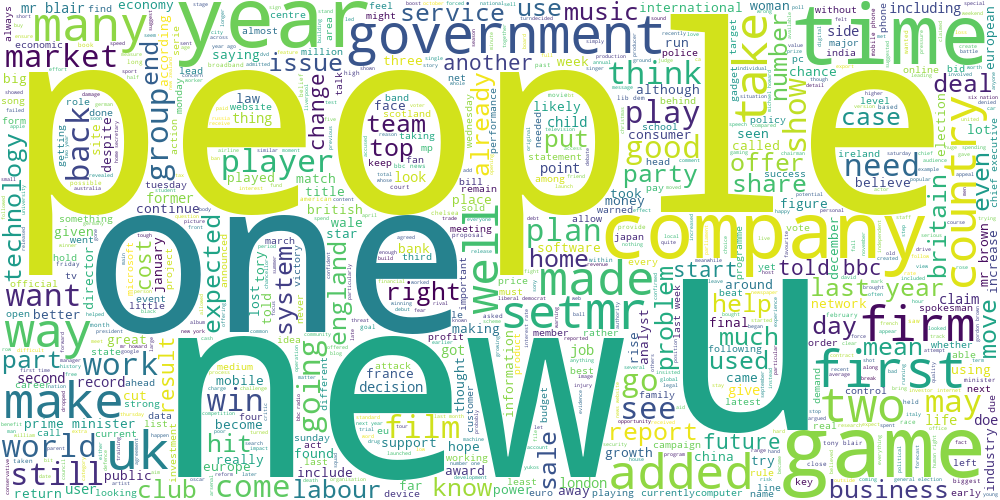

In [87]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [88]:
from sklearn.feature_extraction.text import TfidfVectorizer

Cluster 1


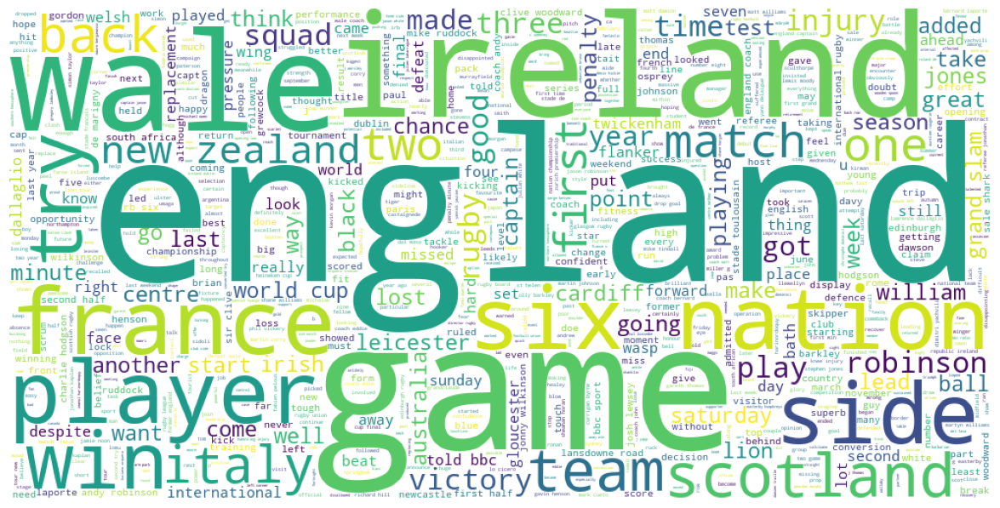

Cluster 2


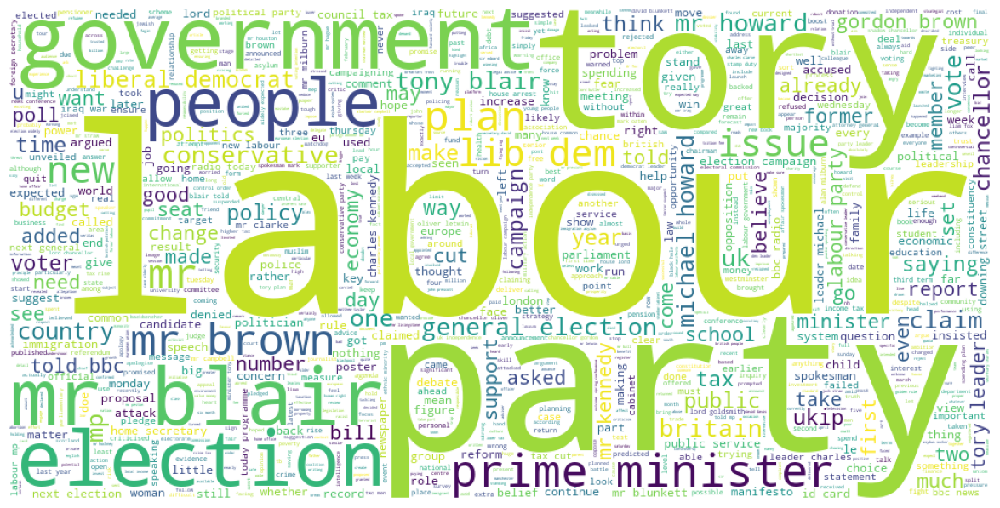

Cluster 3


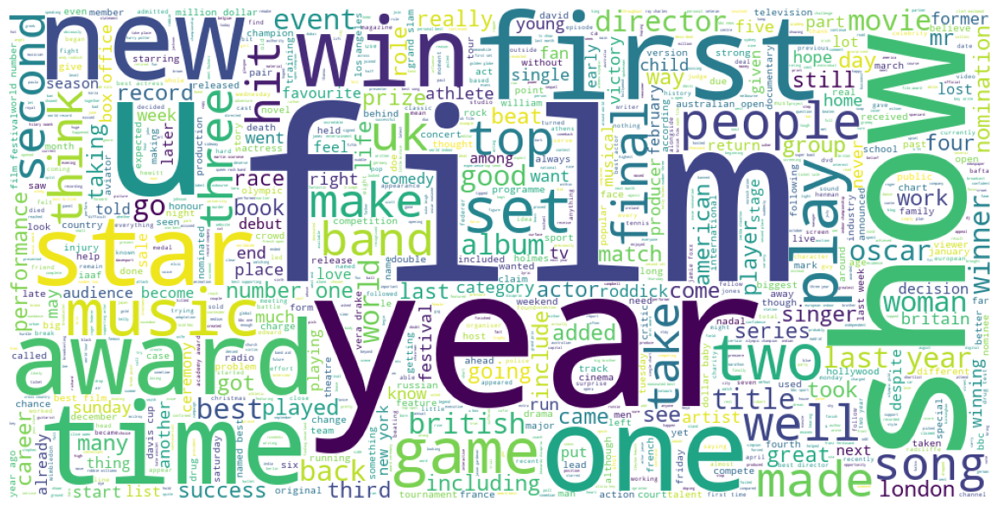

Cluster 4


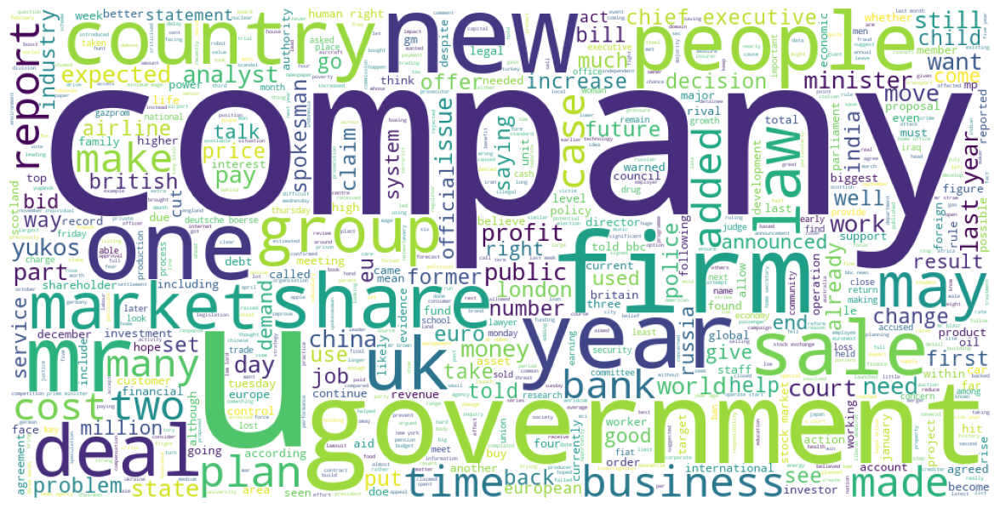

Cluster 5


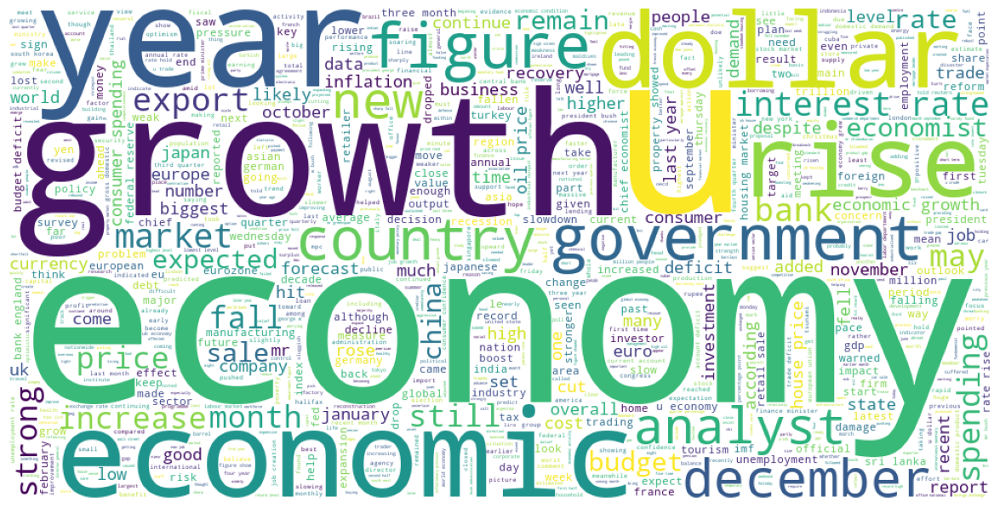

Cluster 6


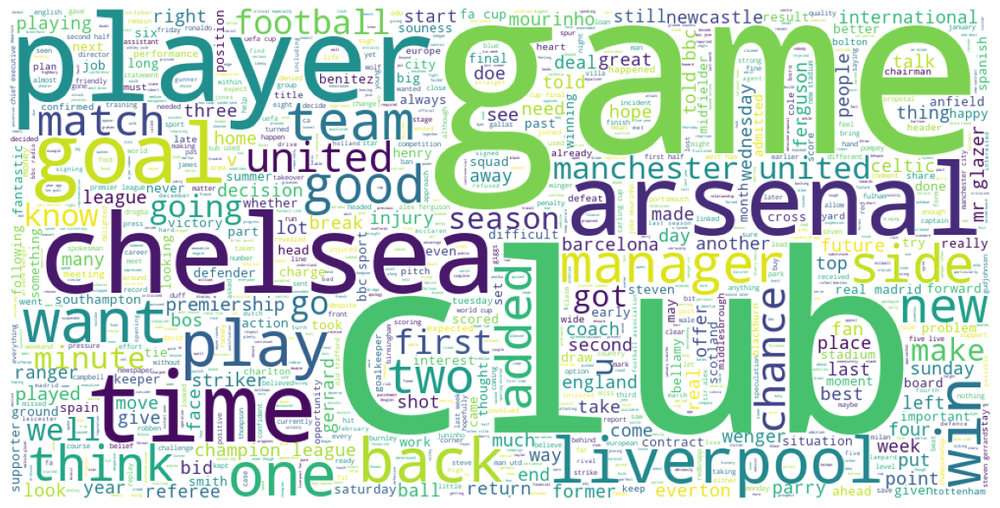

Cluster 7


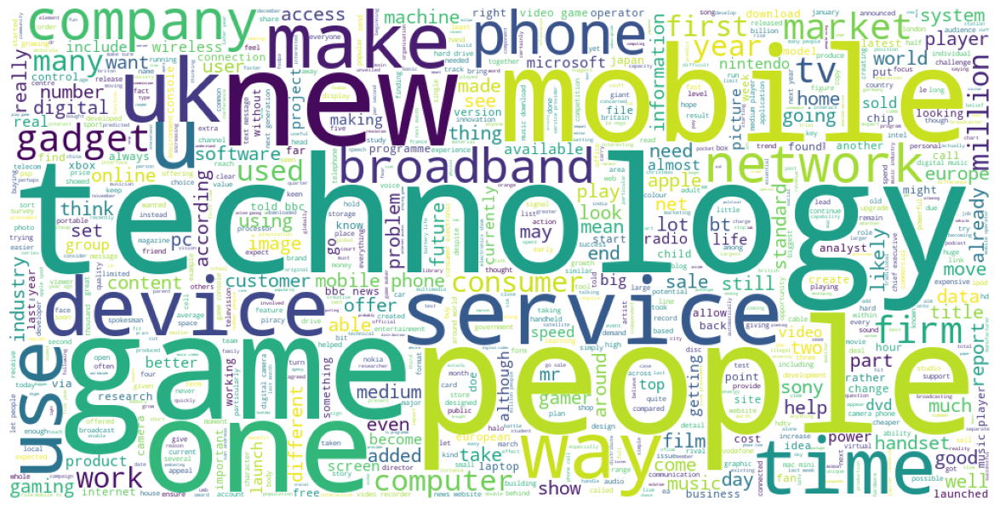

Cluster 8


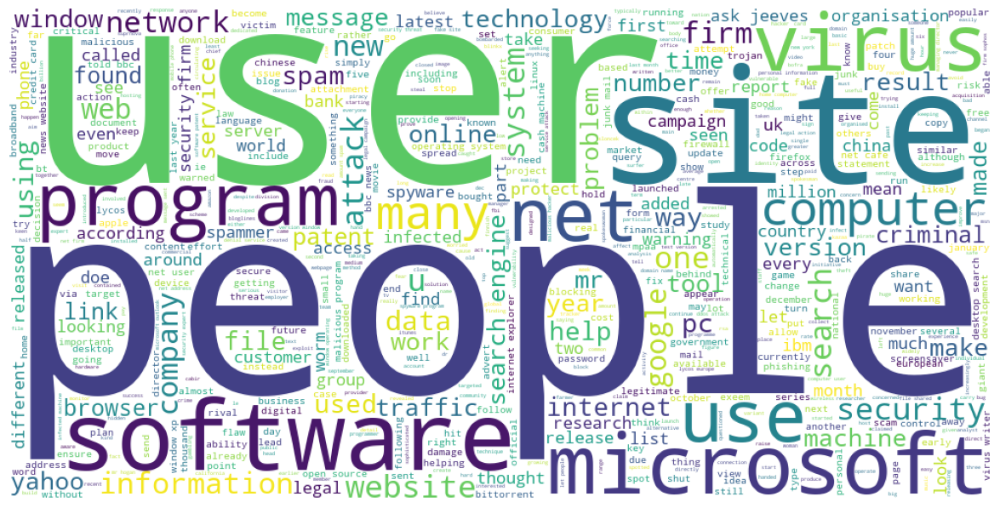

In [90]:
def analyze_clusters(data):
    v = TfidfVectorizer(min_df=3)
    X = v.fit_transform(data.text)
    
    clf = KMeans(n_clusters=8)
    labels_kmeans = clf.fit_predict(X)
    
    feature_names = v.get_feature_names_out()
    texts_per_cluster = {i: [] for i in range(8)}
    
    for text, label in zip(data.text, labels_kmeans):
        texts_per_cluster[label].append(text)
    
    for i in range(8):
        print(f'Cluster {i + 1}')
        image = draw_wordcloud(texts_per_cluster[i])
        plt.figure(figsize=(15, 7.5))
        plt.imshow(image)
        plt.axis("off")
        plt.show()

    return labels_kmeans

labels_kmeans = analyze_clusters(data)

получаем примерно такое

1. британия
2. политика
3. фильмы
4. бизнес
5. экономика
6. футбол
7. технологии
8. пользователи 
   

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

In [93]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

def analyze_clusters(data):
    v = TfidfVectorizer(min_df=3)
    X = v.fit_transform(data.text)
    
    clf = KMeans(n_clusters=8)
    clf.fit(X)
    
    feature_names = v.get_feature_names_out()
    
    key_words = feature_names
    for i, ind in enumerate(np.argmax(clf.cluster_centers_, axis=1)):
        print(f'Cluster {i + 1}: {key_words[ind]}')

analyze_clusters(data)

Cluster 1: mr
Cluster 2: music
Cluster 3: mr
Cluster 4: game
Cluster 5: economy
Cluster 6: software
Cluster 7: profit
Cluster 8: film


ну что то не очнь получилось

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

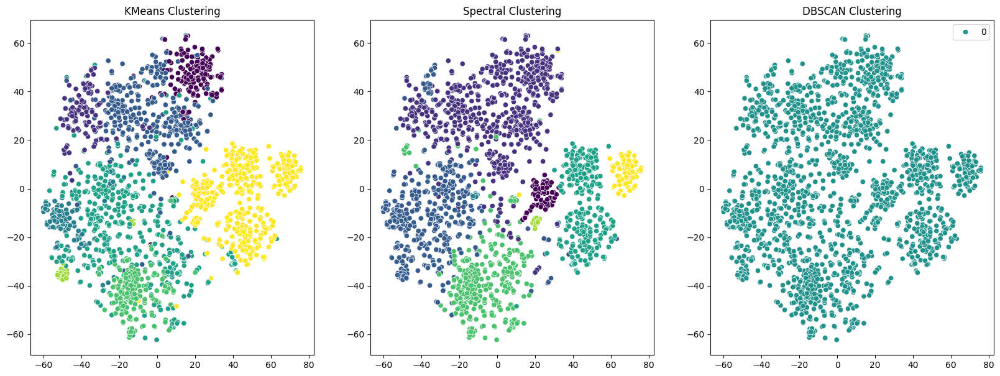

In [95]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns


v = TfidfVectorizer(min_df=3)
X = v.fit_transform(data.text)

clf_kmeans = KMeans(n_clusters=8, random_state=42)
labels_kmeans = clf_kmeans.fit_predict(X)

clf_spectral = SpectralClustering(n_clusters=8, random_state=42, affinity='nearest_neighbors')
labels_spec = clf_spectral.fit_predict(X)

clf_dbscan = DBSCAN(eps=0.5, min_samples=5)
labels_dbscan = clf_dbscan.fit_predict(X)

tsne_model = TSNE(n_components=2, random_state=42, init='random')
t = tsne_model.fit_transform(X)

fig, ax = plt.subplots(1, 3, figsize=(20, 7))
sns.scatterplot(x=t[:, 0], y=t[:, 1], hue=labels_kmeans, palette='viridis', ax=ax[0], legend=None)
ax[0].set_title('KMeans Clustering')

sns.scatterplot(x=t[:, 0], y=t[:, 1], hue=labels_spec, palette='viridis', ax=ax[1], legend=None)
ax[1].set_title('Spectral Clustering')

palette = sns.color_palette('viridis', np.unique(labels_dbscan).max() + 2)
sns.scatterplot(x=t[:, 0], y=t[:, 1], hue=[x+1 for x in labels_dbscan], palette=palette, ax=ax[2])
ax[2].set_title('DBSCAN Clustering')

plt.show()


Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**


Кластеры, сформированные с помощью K-Means, выглядят равномерными и хорошо разделенными. Метод смог эффективно разграничить данные на сбалансированные группы


Спектральная кластеризация также показала хорошие результаты, но с некоторыми особенностями: в отличие от K-Means, здесь видно, что один из кластеров получился более разбросанным 


Результаты DBSCAN отличаются от двух других методов. Видно, что DBSCAN выделил один большой кластер, а остальные данные не были отнесены к каким-либо кластерам 

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

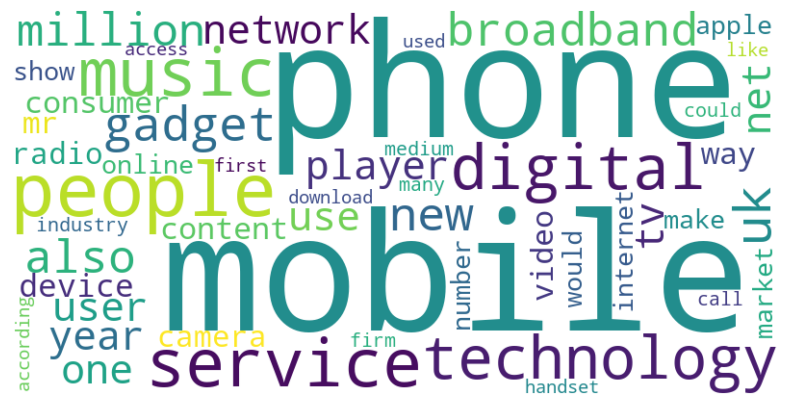

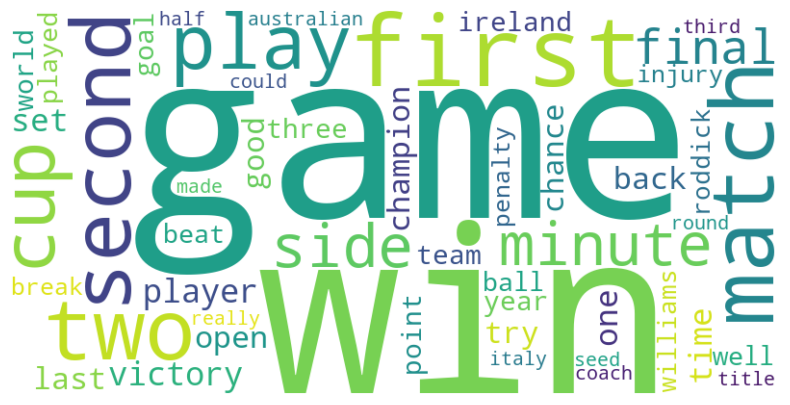

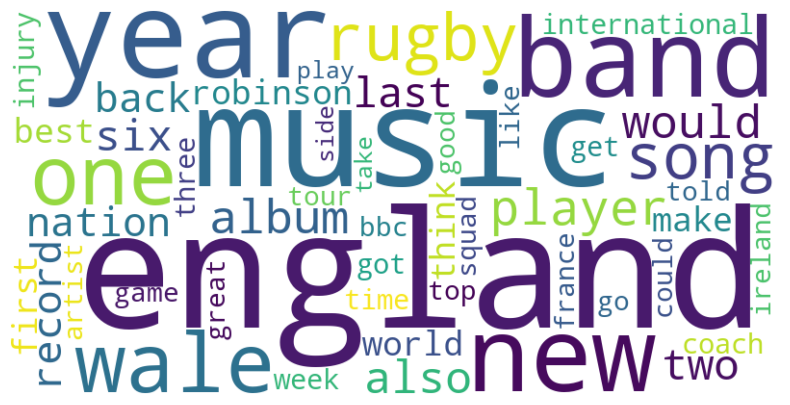

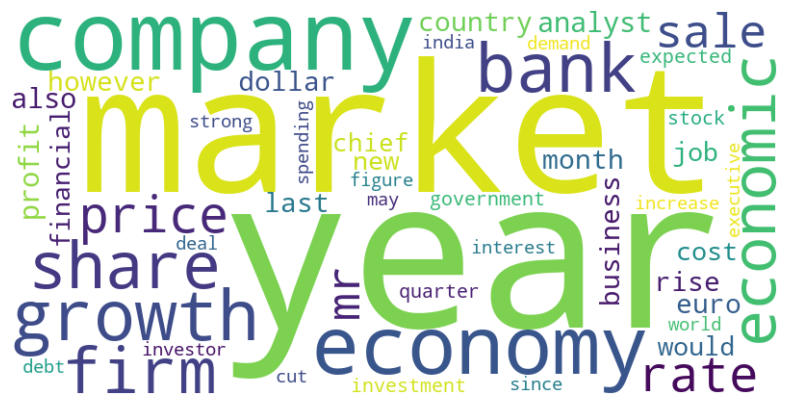

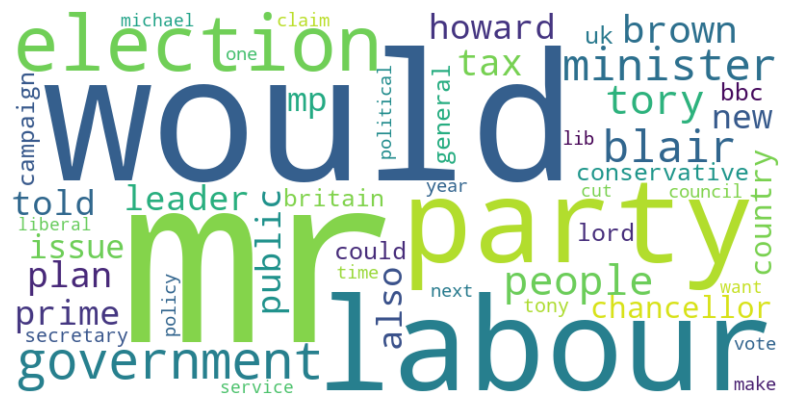

In [97]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud

count_vect = CountVectorizer()
X_bow = count_vect.fit_transform(data.text)

n_components = 24 
lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
lda.fit(X_bow)

topic_distribution = lda.transform(X_bow)
labels_lda = np.argmax(topic_distribution, axis=1)

top_topics = np.argsort(np.bincount(labels_lda))[-5:]

def draw_wordcloud(topic_idx):
    topic_words = dict(zip(count_vect.get_feature_names_out(), lda.components_[topic_idx]))
    sorted_words = sorted(topic_words.items(), key=lambda kv: kv[1], reverse=True)[:50]
    word_cloud_dict = {word: freq for word, freq in sorted_words}
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_cloud_dict)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

for topic_idx in top_topics:
    draw_wordcloud(topic_idx)


## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [98]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

train_data, test_data = train_test_split(data, test_size=0.3, random_state=42)

y_train = train_data.category
y_test = test_data.category

tfidf = TfidfVectorizer(min_df=3)
X_train_tfidf = tfidf.fit_transform(train_data.text)
X_test_tfidf = tfidf.transform(test_data.text)

clf_tfidf = LogisticRegression()
clf_tfidf.fit(X_train_tfidf, y_train)
y_pred_train_tfidf = clf_tfidf.predict(X_train_tfidf)
y_pred_test_tfidf = clf_tfidf.predict(X_test_tfidf)

print(f'Model 1 - TFIDF + Logistic Regression - Train accuracy: {accuracy_score(y_train, y_pred_train_tfidf)}')
print(f'Model 1 - TFIDF + Logistic Regression - Test accuracy: {accuracy_score(y_test, y_pred_test_tfidf)}')

kmeans = KMeans()
kmeans.fit(X_train_tfidf)
X_train_kmeans = cdist(X_train_tfidf.toarray(), kmeans.cluster_centers_)
X_test_kmeans = cdist(X_test_tfidf.toarray(), kmeans.cluster_centers_)

clf_kmeans = LogisticRegression()
clf_kmeans.fit(X_train_kmeans, y_train)
y_pred_train_kmeans = clf_kmeans.predict(X_train_kmeans)
y_pred_test_kmeans = clf_kmeans.predict(X_test_kmeans)

print(f'Model 2 - KMeans + Logistic Regression - Train accuracy: {accuracy_score(y_train, y_pred_train_kmeans)}')
print(f'Model 2 - KMeans + Logistic Regression - Test accuracy: {accuracy_score(y_test, y_pred_test_kmeans)}')

count_vect = CountVectorizer()
X_train_bow = count_vect.fit_transform(train_data.text)
X_test_bow = count_vect.transform(test_data.text)
lda = LatentDirichletAllocation(n_components=24, random_state=42)
X_train_lda = lda.fit_transform(X_train_bow)
X_test_lda = lda.transform(X_test_bow)

clf_lda = LogisticRegression()
clf_lda.fit(X_train_lda, y_train)
y_pred_train_lda = clf_lda.predict(X_train_lda)
y_pred_test_lda = clf_lda.predict(X_test_lda)

print(f'Model 3 - LDA + Logistic Regression - Train accuracy: {accuracy_score(y_train, y_pred_train_lda)}')
print(f'Model 3 - LDA + Logistic Regression - Test accuracy: {accuracy_score(y_test, y_pred_test_lda)}')


Model 1 - TFIDF + Logistic Regression - Train accuracy: 0.9967886962106616
Model 1 - TFIDF + Logistic Regression - Test accuracy: 0.9745508982035929
Model 2 - KMeans + Logistic Regression - Train accuracy: 0.827874116891458
Model 2 - KMeans + Logistic Regression - Test accuracy: 0.8263473053892215
Model 3 - LDA + Logistic Regression - Train accuracy: 0.8580603725112396
Model 3 - LDA + Logistic Regression - Test accuracy: 0.9431137724550899


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**

лучше всего первая модель, это связано с количеством признаков, тут это как раз пошло на пользу

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [99]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

train_data, test_data = train_test_split(data, test_size=0.3, random_state=42)
pretrain_data, valid_data = train_test_split(train_data, test_size=0.3, random_state=42)
unmarked_data, marked_data = train_test_split(pretrain_data, train_size=0.05/0.7, random_state=42)

y_marked = marked_data.category
y_valid = valid_data.category
y_test = test_data.category

tfidf = TfidfVectorizer(min_df=3)
tfidf.fit(pretrain_data.text)  
X_marked = tfidf.transform(marked_data.text)
X_valid = tfidf.transform(valid_data.text)
X_test = tfidf.transform(test_data.text)

best_score = 0
best_C = None
for C in np.logspace(0, 3, 10):
    clf1 = LogisticRegression(C=C)
    clf1.fit(X_marked, y_marked)
    score = accuracy_score(y_valid, clf1.predict(X_valid))
    if score > best_score:
        best_score = score
        best_C = C

clf1 = LogisticRegression(C=best_C)
clf1.fit(X_marked, y_marked)
test_accuracy = accuracy_score(y_test, clf1.predict(X_test))
print(f'Model 1 - Best C: {best_C}')
print(f'Model 1 - Test accuracy: {test_accuracy}')

best_score_kmeans = 0
best_n_clusters = None
X_pretrain_tfidf = tfidf.transform(pretrain_data.text)  # tf-idf для всего трейна

for n_clusters in range(10, 101, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_pretrain_tfidf)
    X_marked_kmeans = cdist(X_marked.toarray(), kmeans.cluster_centers_)
    X_valid_kmeans = cdist(X_valid.toarray(), kmeans.cluster_centers_)
    
    clf_kmeans = LogisticRegression()
    clf_kmeans.fit(X_marked_kmeans, y_marked)
    score_kmeans = accuracy_score(y_valid, clf_kmeans.predict(X_valid_kmeans))
    
    if score_kmeans > best_score_kmeans:
        best_score_kmeans = score_kmeans
        best_n_clusters = n_clusters

kmeans = KMeans(n_clusters=best_n_clusters, random_state=42)
kmeans.fit(X_pretrain_tfidf)
X_test_kmeans = cdist(X_test.toarray(), kmeans.cluster_centers_)
clf_kmeans = LogisticRegression()
clf_kmeans.fit(cdist(X_marked.toarray(), kmeans.cluster_centers_), y_marked)
test_accuracy_kmeans = accuracy_score(y_test, clf_kmeans.predict(X_test_kmeans))
print(f'Model 2 - Best number of clusters: {best_n_clusters}')
print(f'Model 2 - Test accuracy: {test_accuracy_kmeans}')

best_score_lda = 0
best_n_components = None
count_vect = CountVectorizer()
X_pretrain_bow = count_vect.fit_transform(pretrain_data.text)

for n_components in range(10, 31, 5):
    lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
    lda.fit(X_pretrain_bow)
    X_marked_lda = lda.transform(count_vect.transform(marked_data.text))
    X_valid_lda = lda.transform(count_vect.transform(valid_data.text))
    
    clf_lda = LogisticRegression()
    clf_lda.fit(X_marked_lda, y_marked)
    score_lda = accuracy_score(y_valid, clf_lda.predict(X_valid_lda))
    
    if score_lda > best_score_lda:
        best_score_lda = score_lda
        best_n_components = n_components

lda = LatentDirichletAllocation(n_components=best_n_components, random_state=42)
lda.fit(X_pretrain_bow)
X_test_lda = lda.transform(count_vect.transform(test_data.text))
clf_lda = LogisticRegression()
clf_lda.fit(X_marked_lda, y_marked)
test_accuracy_lda = accuracy_score(y_test, clf_lda.predict(X_test_lda))
print(f'Model 3 - Best number of LDA components: {best_n_components}')
print(f'Model 3 - Test accuracy: {test_accuracy_lda}')



Model 1 - Best C: 21.544346900318832
Model 1 - Test accuracy: 0.9745508982035929


/Users/maximzabelin/Library/Caches/pypoetry/virtualenvs/ml-hw-tOTRivSJ-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/maximzabelin/Library/Caches/pypoetry/virtualenvs/ml-hw-tOTRivSJ-py3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documenta

Model 2 - Best number of clusters: 90
Model 2 - Test accuracy: 0.9461077844311377
Model 3 - Best number of LDA components: 30
Model 3 - Test accuracy: 0.9296407185628742


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

В общем результаты улучшились и это пошло на пользу 

LDA в данной задаче не нуждается в разметке



## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Мы ходили на дигустацию и музей каньяка в Ереване 

Нам очень понравилось